In [ ]:
pip install -q transformers

In [52]:
import tarfile
import shutil
import zipfile

import pandas as pd
import numpy as np
import os
import ast
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from textwrap import wrap
from PIL import Image
import seaborn as sns

from transformers import ViTImageProcessor, ViTForImageClassification
import torch
import pickle

np.random.seed(123)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#import training data
boston_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/BOS_2016_17_img_lon_lat.csv")

boston_data.head()

,MLSNUM,DOM,SOLDPRICE,LISTDATE,SOLDDATE,ADDRESS,CITY,ZIP,BEDS,BATHS,SQFT,AGE,GARAGE,LOTSIZE,LON,LAT
0,71500500,897,295850.0,3/30/2013,2016-01-29,67 Virginia Drive,Leicester,1524,2,2.0,1368,3,2.0,1306800.0,-71.894877,42.199772
1,71595485,658,470519.0,10/10/2013,2016-01-14,33 Windemere Circle,Tyngsborough,1879,2,2.5,1850,5,2.0,5000.0,-71.437289,42.653563
2,71661544,467,232000.0,4/15/2014,2016-01-07,394 Essex,Salem,1970,2,1.0,1469,38,0.0,NaN,-70.904825,42.519118
3,71677610,565,996946.0,5/8/2014,2016-01-08,Lot 16 Chittenden Lane,Cohasset,2025,2,2.5,2945,4,2.0,NaN,-73.939503,40.854944
4,71683436,56,604516.0,5/18/2014,2016-01-15,54 Stevens Rd,Hudson,1749,3,2.5,2536,3,2.0,NaN,-71.559680,42.384878


In [4]:
boston_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10956 entries, 0 to 10955
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   MLSNUM     10956 non-null  int64  
 1   DOM        10956 non-null  int64  
 2   SOLDPRICE  10956 non-null  float64
 3   LISTDATE   10956 non-null  object 
 4   SOLDDATE   10956 non-null  object 
 5   ADDRESS    10956 non-null  object 
 6   CITY       10956 non-null  object 
 7   ZIP        10956 non-null  int64  
 8   BEDS       10956 non-null  int64  
 9   BATHS      10956 non-null  float64
 10  SQFT       10956 non-null  int64  
 11  AGE        10956 non-null  int64  
 12  GARAGE     10955 non-null  float64
 13  LOTSIZE    2897 non-null   float64
 14  LON        10956 non-null  float64
 15  LAT        10956 non-null  float64
dtypes: float64(6), int64(6), object(4)
memory usage: 1.3+ MB


In [ ]:
'''import shutil

from_dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/BOS_satellite_imgs/satellite_imgs/'
to_dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/BOS_satellite_imgs/'

files = os.listdir(from_dir)
for f in files:
  shutil.move(from_dir+f, to_dir+f)
'''

In [5]:
dir = '/content/drive/MyDrive/imgs'
files = os.listdir(dir)
len(files)

38667

In [38]:
classified_imgs = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/img_info.csv')

categories = [ast.literal_eval(row)[0].split(' -> ') for row in classified_imgs.categories.values]
categories_df = pd.DataFrame(categories, columns=['cat1_prob','cat1'])

classified_imgs = pd.concat([classified_imgs,categories_df],axis=1)
classified_imgs.head()

,image_number,categories,cat1_prob,cat1
0,72017423_img_7.jpg,"['0.358 -> bow_window/indoor', '0.244 -> artis...",0.358,bow_window/indoor
1,72017651_img_2.jpg,"['0.552 -> dining_room', '0.233 -> dining_hall...",0.552,dining_room
2,72017651_img_1.jpg,"['0.715 -> dining_room', '0.087 -> dining_hall...",0.715,dining_room
3,72017651_img_0.jpg,"['0.632 -> dining_room', '0.137 -> bow_window/...",0.632,dining_room
4,72017651_img_3.jpg,"['0.768 -> kitchen', '0.101 -> wet_bar', '0.04...",0.768,kitchen


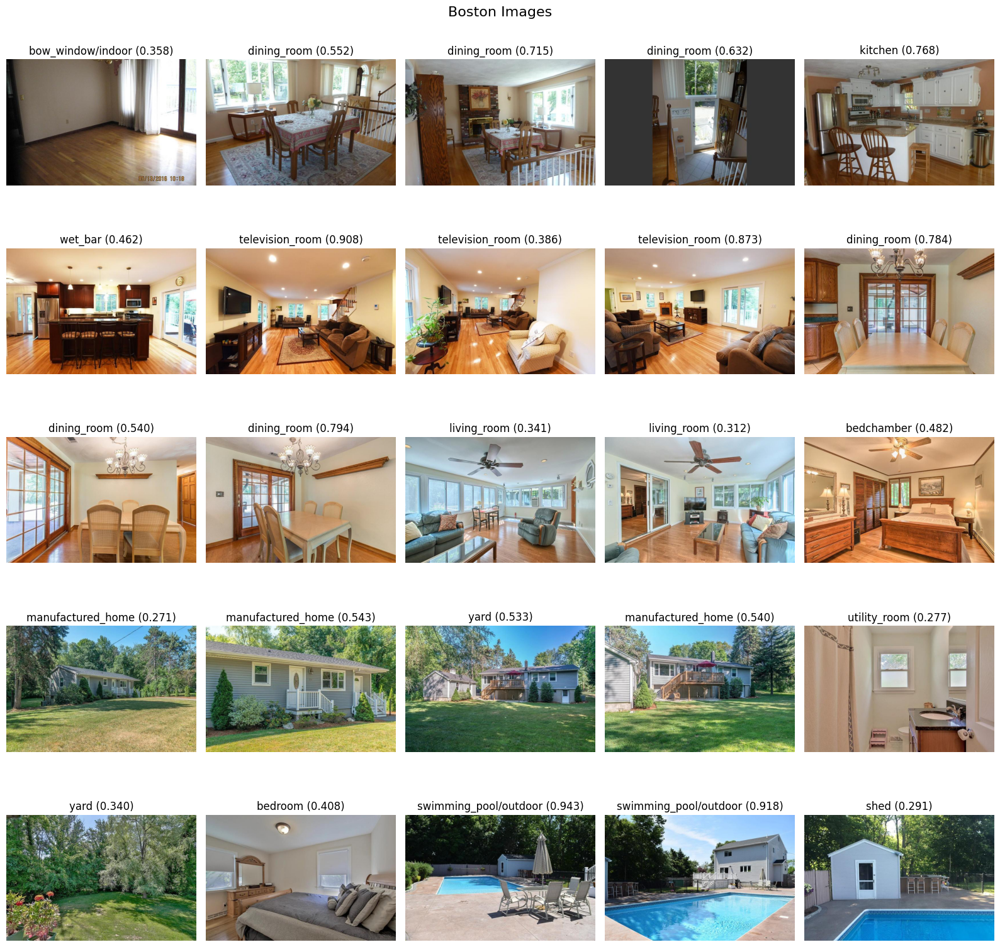

In [39]:
fig, axs = plt.subplots(5,5, figsize=(16,16))
axs = axs.ravel()

for i,f in enumerate(classified_imgs.image_number[0:25]):
  img = mpimg.imread(dir+'//'+f)
  axs[i].imshow(img)
  axs[i].set_title(f"{classified_imgs.cat1[i]} ({classified_imgs.cat1_prob[i]})")
  axs[i].axis("off")
plt.suptitle("Boston Images", fontsize=16)
plt.tight_layout()
plt.show();

In [40]:
(classified_imgs.cat1.value_counts())[:50]

kitchen                     3344
dining_room                 2415
bathroom                    2330
bedroom                     2286
manufactured_home           2192
bow_window/indoor           1936
television_room             1742
living_room                 1735
wet_bar                     1454
yard                        1357
entrance_hall               1214
attic                       1065
alcove                       806
garage/outdoor               798
utility_room                 752
porch                        662
childs_room                  641
patio                        623
basement                     602
corridor                     443
artists_loft                 431
closet                       429
shower                       366
nursery                      362
house                        353
staircase                    337
waiting_room                 328
home_office                  322
balcony/interior             313
driveway                     286
inn/outdoo

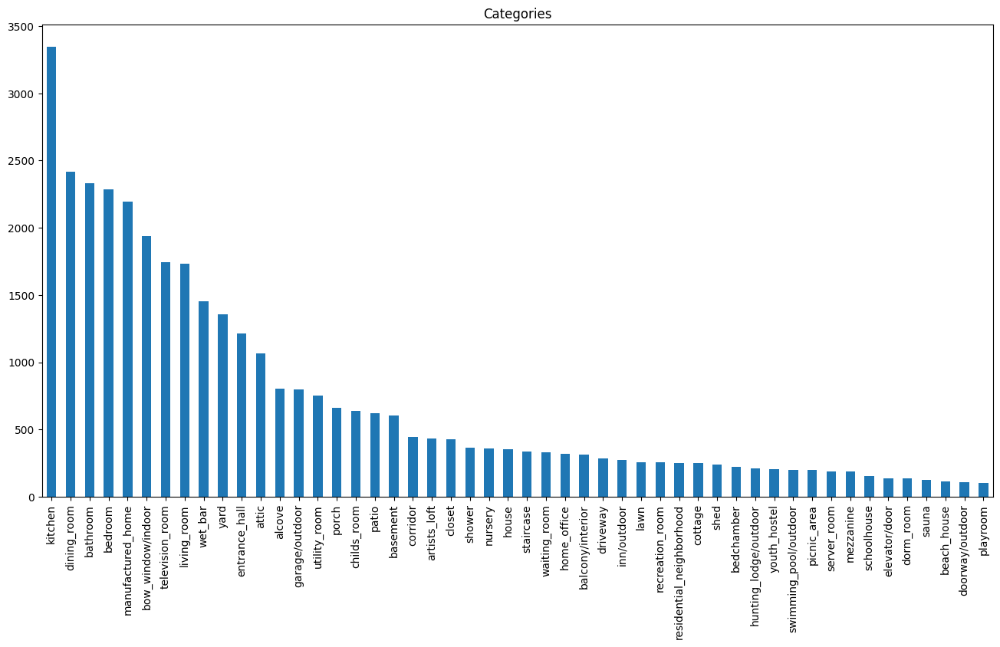

In [41]:
plt.figure(figsize=(16,8))
(classified_imgs.cat1.value_counts())[:50].plot(kind='bar')
plt.title("Categories")
plt.show();

In [23]:
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

In [24]:
print(model)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [43]:
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
classified_imgs['vit_cat1'] = ""

for i,file in enumerate(classified_imgs.image_number):
  try:
    image = mpimg.imread(dir+r"/"+file)
    inputs = processor(images=image, return_tensors="pt")
    pixel_values = inputs.pixel_values

    with torch.no_grad():
      outputs = model(pixel_values)
    logits = outputs.logits
    prediction = logits.argmax(-1)
    classified_imgs.iat[i,4] = model.config.id2label[prediction.item()]
  except:
    continue

In [44]:
classified_imgs.to_csv('/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/img_info_w_vit.csv', index=False)

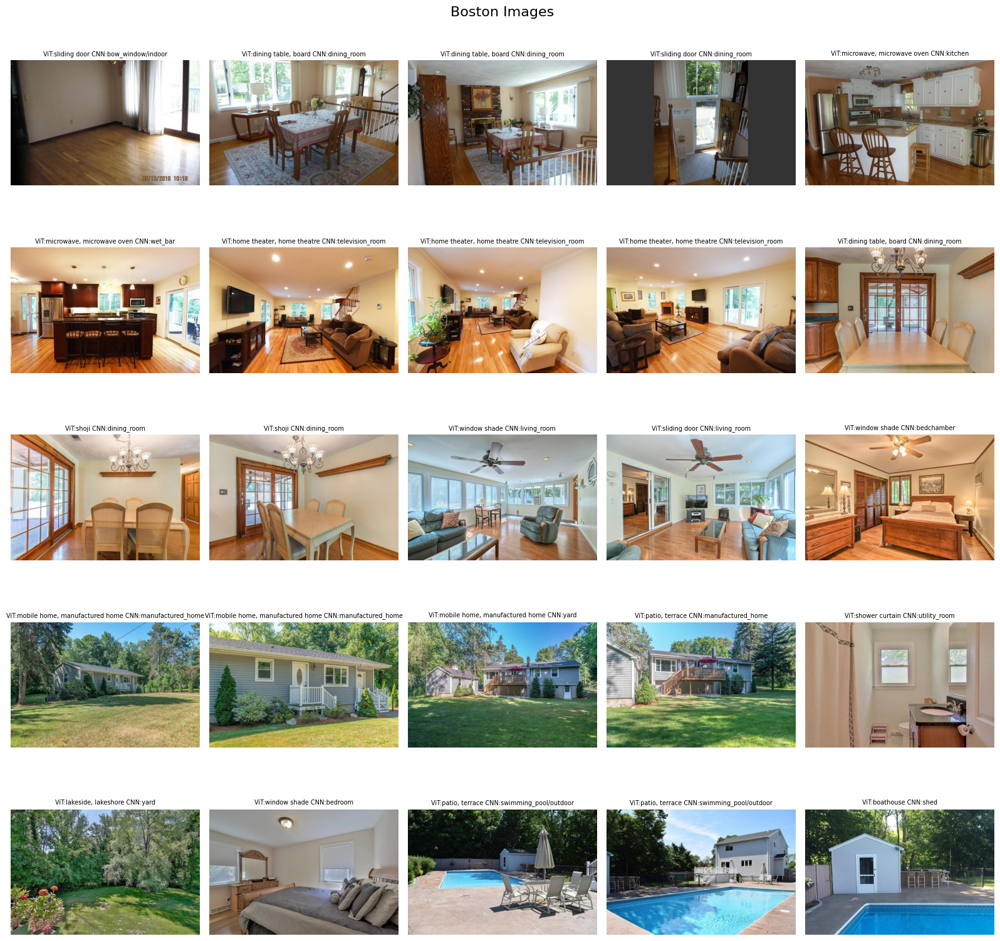

In [58]:
fig, axs = plt.subplots(5,5, figsize=(16,16))
axs = axs.ravel()

for i,f in enumerate(classified_imgs.image_number[0:25]):
  img = mpimg.imread(dir+'//'+f)
  axs[i].imshow(img)
  axs[i].set_title(f"ViT:{classified_imgs.vit_cat1[i]} CNN:{classified_imgs.cat1[i]}", size=7, wrap=True)
  axs[i].axis("off")
plt.suptitle("Boston Images", fontsize=16)
plt.tight_layout()
plt.show();

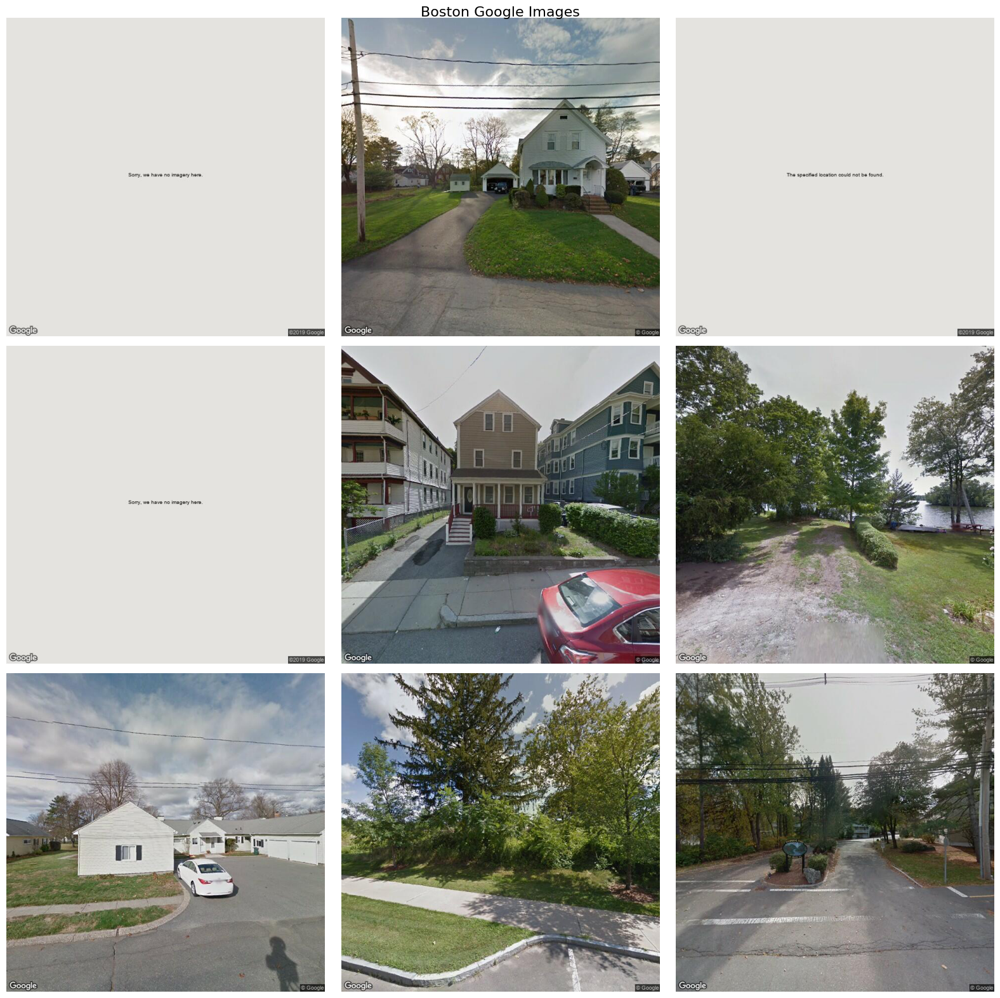

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/BOS_google_imgs/'

files = os.listdir(dir)

goo_img_lst = []
for f in files:
  goo_img_lst.append(f[:-4])

fig, axs = plt.subplots(3,3, figsize=(16,16))
axs = axs.ravel()

for i,f in enumerate(files[0:9]):
  img = mpimg.imread(dir+f)
  axs[i].imshow(img)
  axs[i].axis("off")
plt.suptitle("Boston Google Images", fontsize=16)
plt.tight_layout()
plt.show();

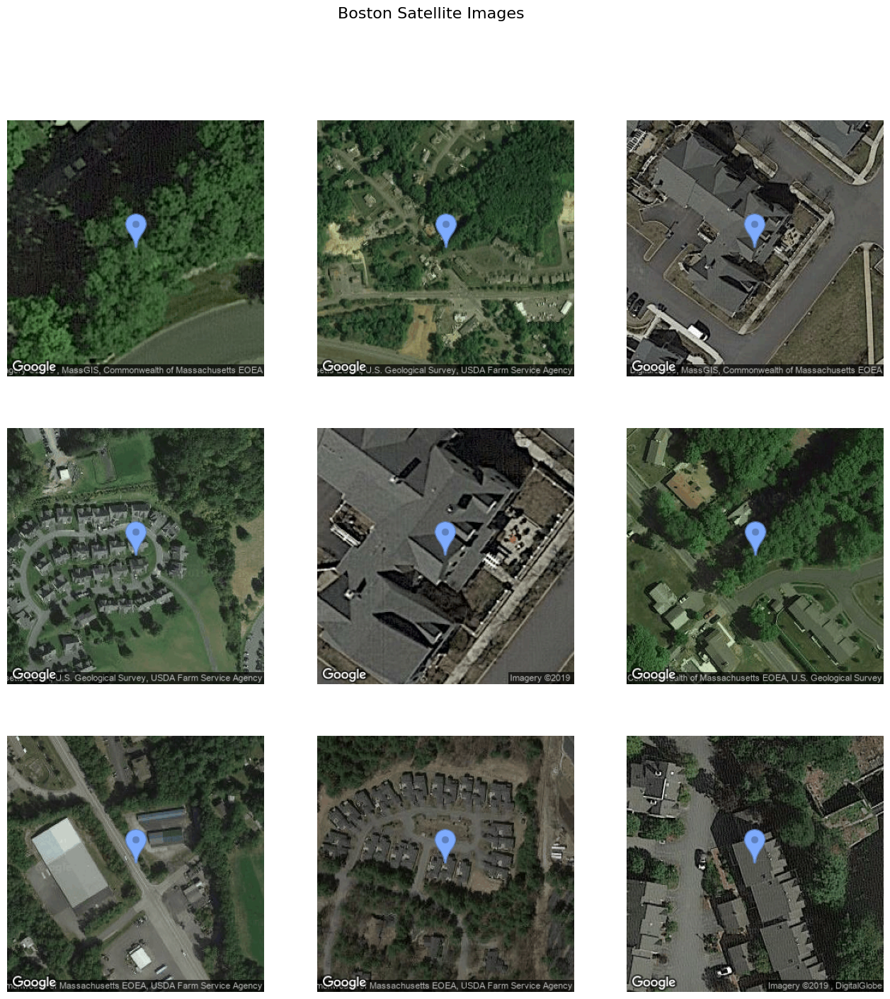

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/BOS_satellite_imgs/'

files = os.listdir(dir)

img_lst = []
sat_img_lst = []
for f in files:
  img_lst.append(f)
  sat_img_lst.append(f[:-6])

fig, axs = plt.subplots(3,3, figsize=(16,16))
axs = axs.ravel()

for i,f in enumerate(files[0:9]):
  img = mpimg.imread(dir+f)
  axs[i].imshow(img)
  axs[i].axis("off")
plt.suptitle("Boston Satellite Images", fontsize=16)
plt.show();

In [ ]:
img_lst[:20]

['7178899520.jpg',
 '7178899516.jpg',
 '7178739119.jpg',
 '7179034117.jpg',
 '7178739120.jpg',
 '7178899518.jpg',
 '7178426917.jpg',
 '7178115117.jpg',
 '7178491819.jpg',
 '7178491815.jpg',
 '7176923819.jpg',
 '7178115119.jpg',
 '7178491818.jpg',
 '7178899517.jpg',
 '7178426916.jpg',
 '7178426920.jpg',
 '7178348419.jpg',
 '7176923820.jpg',
 '7178412416.jpg',
 '7178348420.jpg']

In [ ]:
sat_img_lst[:20]

['71788995',
 '71788995',
 '71787391',
 '71790341',
 '71787391',
 '71788995',
 '71784269',
 '71781151',
 '71784918',
 '71784918',
 '71769238',
 '71781151',
 '71784918',
 '71788995',
 '71784269',
 '71784269',
 '71783484',
 '71769238',
 '71784124',
 '71783484']

In [ ]:
boston_data[boston_data.MLSNUM.str.contains('71788')]

,MLSNUM,DOM,SOLDPRICE,LISTDATE,SOLDDATE,ADDRESS,CITY,ZIP,BEDS,BATHS,SQFT,AGE,GARAGE,LOTSIZE,LON,LAT
8337,71788667,3,6825000.0,1/30/2015,2016-11-04,1 Franklin Street,Boston,2110,3,4.5,3172,2,2.0,NaN,-71.05945,42.35631
9639,71788664,111,2875000.0,1/30/2015,2016-12-01,1 Franklin Street,Boston,2110,2,2.0,1486,2,1.0,NaN,-71.05945,42.35631


In [ ]:
test = boston_data.MLSNUM.apply(lambda x:x[:3])

test.value_counts()

720    6940
719    3775
718     135
717      74
716      14
721      13
715       4
722       1
Name: MLSNUM, dtype: int64

In [ ]:
boston_data.MLSNUM = boston_data.MLSNUM.astype('str')
missing_df = boston_data[['MLSNUM']].copy()
missing_df['google'] = 0
missing_df['satellite'] = 0

for i,itm in enumerate(missing_df.MLSNUM):
  if itm not in goo_img_lst:
    missing_df.iat[i,1] = 1

  if itm not in sat_img_lst:
    missing_df.iat[i,2] = 1

In [ ]:
missing_df.head()

,MLSNUM,google,satellite
0,71500500,0,0
1,71595485,1,0
2,71661544,0,0
3,71677610,1,0
4,71683436,0,0


In [ ]:
np.sum(missing_df.google)/len(missing_df.google), np.sum(missing_df.satellite)/len(missing_df.satellite)

(0.001004016064257028, 0.9930631617378606)

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/NYC_imgs/'

files = os.listdir(dir)

nyc_img_lst = []
for f in files:
  nyc_img_lst.append(f[:-4])

In [ ]:
nyc_img_lst[:10]

['1111117_img_0',
 '1111117_img_1',
 '1111117_img_10',
 '1111117_img_11',
 '1111117_img_12',
 '1111117_img_13',
 '1111117_img_14',
 '1111117_img_15',
 '1111117_img_16',
 '1111117_img_17']

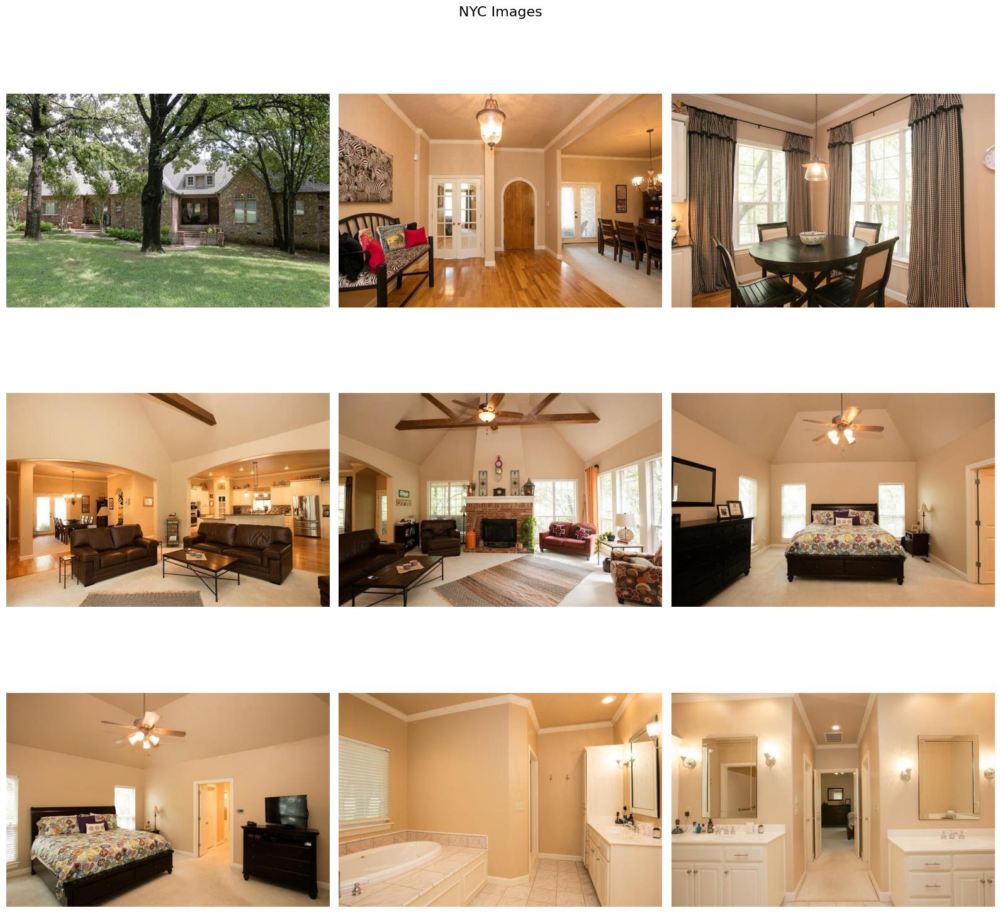

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Real_Estate_VIS_features_S14a_2023/NYC_imgs/'
files = os.listdir(dir)

fig, axs = plt.subplots(3,3, figsize=(16,16))
axs = axs.ravel()

for i,f in enumerate(files[0:9]):
  img = mpimg.imread(dir+f)
  axs[i].imshow(img)
  axs[i].axis("off")
plt.suptitle("NYC Images", fontsize=16)
plt.tight_layout()
plt.show();